In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import sqlite3
import numpy as np
import math
import matplotlib.dates as mdates
import seaborn as sns
import geopandas as gpd

### Importing Dataset

In [12]:
#read in selected files
df = pd.read_csv('country_vaccinations.csv')

manu = pd.read_csv('country_vaccinations_by_manufacturer.csv')

gm = pd.read_csv('gapminder_tidy.csv')

l_df=pd.read_csv('csvData.csv')

gg = pd.read_csv('poc_2020.csv')
gg.head()

## map plot based on country map from gpd
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


### Data Cleaning & Processing

In [13]:
def process_data(df):
    #Convert to DateTime object
    df["date1"] = pd.to_datetime(df.date) 
    #Format to Month-Year
    df["Month"]= df.date1.dt.strftime('%m/%Y')
    #Aggregate data
    df = df.groupby(["country","Month"]).agg(monthly_vacc = ("daily_vaccinations", np.sum))
    df = df.reset_index()
    return df

vacc_sum = process_data(df)
vacc_sum

,country,Month,monthly_vacc
0,Afghanistan,02/2021,8202.0
1,Afghanistan,03/2021,85894.0
2,Afghanistan,04/2021,219606.0
3,Afghanistan,05/2021,153131.0
4,Albania,01/2021,741.0
...,...,...,...
842,Zambia,05/2021,85284.0
843,Zimbabwe,02/2021,11455.0
844,Zimbabwe,03/2021,66743.0
845,Zimbabwe,04/2021,357864.0


In [14]:
clean = gm[gm.Year == 2013]

clean = vacc_sum.merge(clean, left_on = ['country'], right_on = ['Country'], copy = False)
clean['vacc_ratio'] = clean.monthly_vacc / clean['population'] 
clean

Month = ['12/2020', '01/2021', '02/2021', '03/2021', '04/2021', '05/2021']

# sorting data accoring to Month
clean['to_sort'] = clean['Month'].apply(lambda x:Month.index(x))
clean = clean.sort_values('to_sort')

clean

,country,Month,monthly_vacc,Country,Year,fertility,life,population,child_mortality,gdp,gdp-1,region,vacc_ratio,to_sort
74,Belgium,12/2020,416.0,Belgium,2013,1.854,80.548,10815599.0,4.3,40607.0,2114.0,Europe & Central Asia,0.000038,0
503,Portugal,12/2020,25966.0,Portugal,2013,1.315,79.945,10704534.0,3.8,25677.0,10545.0,Europe & Central Asia,0.002426,0
333,Kuwait,12/2020,3363.0,Kuwait,2013,2.600,74.288,2959015.0,9.4,79395.0,NaN,Middle East & North Africa,0.001137,0
497,Poland,12/2020,36650.0,Poland,2013,1.417,76.408,38331803.0,5.2,23144.0,6902.0,Europe & Central Asia,0.000956,0
267,Hungary,12/2020,4054.0,Hungary,2013,1.411,74.620,9933795.0,6.3,22708.0,13450.0,Europe & Central Asia,0.000408,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,Mauritius,05/2021,25308.0,Mauritius,2013,1.501,73.613,1320785.0,14.3,17146.0,NaN,Sub-Saharan Africa,0.019161,5
400,Mexico,05/2021,5842397.0,Mexico,2013,2.185,77.501,117478371.0,14.5,16346.0,1542.0,America,0.049732,5
404,Moldova,05/2021,106291.0,Moldova,2013,1.456,68.899,3495657.0,16.4,4542.0,1383.0,Europe & Central Asia,0.030407,5
272,Iceland,05/2021,83883.0,Iceland,2013,2.083,82.086,331996.0,2.1,40958.0,1125.0,Europe & Central Asia,0.252663,5


In [15]:
#Merge with country information
gm_max_year = gm.groupby(['Country'])['Year'].max().reset_index()
gm_max_year.head()

gm_max = gm.merge(gm_max_year,how='inner',on=['Country','Year'])
gm_max.head()

,Country,Year,fertility,life,population,child_mortality,gdp,gdp-1,region
0,Afghanistan,2013,4.900,60.947,34499915.0,96.7,1884.0,3023.0,South Asia
1,Albania,2013,1.771,77.392,3238316.0,14.9,9961.0,5693.0,Europe & Central Asia
2,Algeria,2013,2.795,71.000,36983924.0,25.2,12893.0,4573.0,Middle East & North Africa
3,Angola,2013,5.863,51.899,20714494.0,167.1,7488.0,5008.0,Sub-Saharan Africa
4,Antigua and Barbuda,2013,2.089,75.954,91404.0,8.7,20353.0,8227.0,America


In [16]:
df_gm = df.merge(gm_max,how='left',left_on='country',right_on='Country')
df_gm.head()

df_gm = df_gm.merge(gg,how='left',left_on='country',right_on='dependency')
df_gm.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,...,dependency,Pop,Change,Change.1,Density,Area,Fert. Rate,Med. Age,Urban,Share
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,...,Afghanistan,38742911.0,2.33%,886592.0,60.0,652860.0,4.6,18,25%,0.50%
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,...,Afghanistan,38742911.0,2.33%,886592.0,60.0,652860.0,4.6,18,25%,0.50%
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,...,Afghanistan,38742911.0,2.33%,886592.0,60.0,652860.0,4.6,18,25%,0.50%
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,...,Afghanistan,38742911.0,2.33%,886592.0,60.0,652860.0,4.6,18,25%,0.50%
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,...,Afghanistan,38742911.0,2.33%,886592.0,60.0,652860.0,4.6,18,25%,0.50%


In [17]:
print(df_gm.columns)

Index(['country', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website', 'date1', 'Month',
       'Country', 'Year', 'fertility', 'life', 'population', 'child_mortality',
       'gdp', 'gdp-1', 'region', 'dependency', 'Pop', 'Change', 'Change.1',
       'Density', 'Area', 'Fert. Rate', 'Med. Age', 'Urban', 'Share'],
      dtype='object')


In [18]:
# drop repeated variables
df_gm.drop("Country",axis=1)
df_gm.drop("dependency",axis=1)

#create new variable 
# fill na with mean or specific variables
df_gm['gdp_per_capita'] = df_gm['gdp'] / df_gm['population']
df_gm['region'] = df_gm['region'].fillna('Unknown')
df_gm['population'] = df_gm['population'].fillna(df_gm['population'].mean())
df_gm['life'] = df_gm['life'].fillna(df_gm['life'].mean())
df_gm['gdp'] = df_gm['gdp'].fillna(df_gm['gdp'].mean())
df_gm['Area'] = df_gm['Area'].fillna(df_gm['Area'].mean())
df_gm['population_per_area'] = df_gm['Area'] / df_gm['population']
df_gm['Total_vaccination']=df_gm['total_vaccinations'].fillna(method="pad")
df_gm['people_fully_vaccinated_per_hundred'] =  np.where(df_gm['people_fully_vaccinated_per_hundred'].isna(),
                                                   (df_gm['total_vaccinations_per_hundred'] /2)  ,
                                                   df_gm['people_fully_vaccinated_per_hundred'])


# cut the variables by quantitle 
df_gm['population_grp'] = pd.qcut(df_gm['population'],q=6)
df_gm['gdp_grp'] = pd.qcut(df_gm['gdp'],q=7)
df_gm['density_grp'] = pd.qcut(df_gm['population_per_area'],q=7)
df_gm['population_per_area'] = pd.qcut(df_gm['population_per_area'],q=7)



#for final visualization keep date before 05/03/2020
df_gm['date1'] = pd.to_datetime(df_gm['date'])
res = df_gm[~(df_gm['date1'] > '2021-05-03')]

#
df_sorted=df_gm.sort_values(by="date")
df_sorted_res=res.sort_values(by="date")

In [21]:
df_gm['vaccines'].unique()


df_gm['American'] = np.where(df_gm['vaccines'].str.contains('Johnson&Johnson|Moderna|Pfizer'),1,0)
df_gm['Russian'] = np.where(df_gm['vaccines'].str.contains('Sputnik V|EpiVacCorona'),1,0)
df_gm['Chinese'] = np.where(df_gm['vaccines'].str.contains('Sinopharm/Beijing|Sinopharm/Wuhan|Sinovac'),1,0)
df_gm['Indian'] = np.where(df_gm['vaccines'].str.contains('Covaxin'),1,0)
df_gm['European'] = np.where(df_gm['vaccines'].str.contains('Oxford|AstraZeneca|BioNTech'),1,0)

df_gm['JJ'] = np.where(df_gm['vaccines'].str.contains('Johnson&Johnson'),1,0)
df_gm['Moderna'] = np.where(df_gm['vaccines'].str.contains('Moderna'),1,0)
df_gm['Pfizer'] = np.where(df_gm['vaccines'].str.contains('Pfizer'),1,0)



In [22]:
mapped = world.set_index('iso_a3').join(df_gm.set_index('iso_code')).reset_index()

### Exploratory Data Analysis

#### 1. Fully Vacinnated People

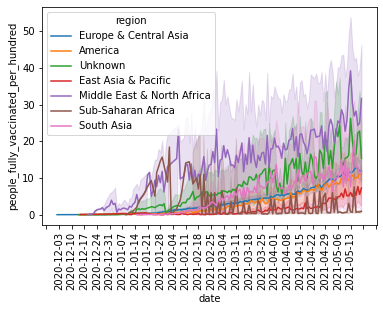

In [28]:
#continent
graph = sns.lineplot(data=df_sorted, x="date", y="people_fully_vaccinated_per_hundred",hue='region')
graph.xaxis.set_major_locator(mdates.DayLocator(interval = 7))
# graph.xaxis.set_major_formatter(mdates.DateFormatter('%Y:%M:%D'))
plt.xticks(rotation = 90)

plt.show()

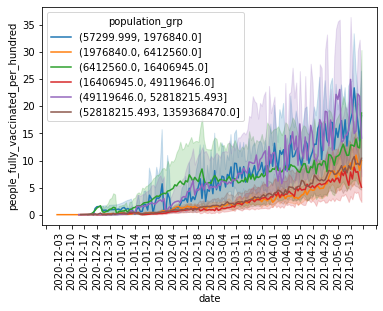

In [29]:
#population
graph = sns.lineplot(data=df_sorted, x="date", y="people_fully_vaccinated_per_hundred",hue='population_grp')
graph.xaxis.set_major_locator(mdates.DayLocator(interval = 7))
# graph.xaxis.set_major_formatter(mdates.DateFormatter('%Y:%M:%D'))
plt.xticks(rotation = 90)

plt.show()

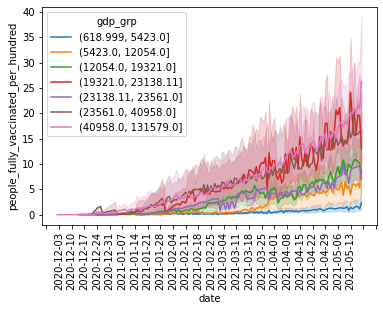

In [30]:
# GDP per person
graph = sns.lineplot(data=df_sorted, x="date", y="people_fully_vaccinated_per_hundred",hue='gdp_grp')
graph.xaxis.set_major_locator(mdates.DayLocator(interval = 7))
# graph.xaxis.set_major_formatter(mdates.DateFormatter('%Y:%M:%D'))
plt.xticks(rotation = 90)

plt.show()



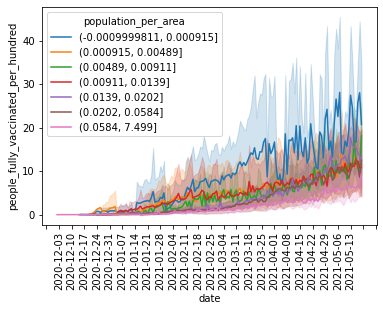

In [31]:
#population density
graph = sns.lineplot(data=df_sorted, x="date", y="people_fully_vaccinated_per_hundred",hue='population_per_area')
graph.xaxis.set_major_locator(mdates.DayLocator(interval = 7))
# graph.xaxis.set_major_formatter(mdates.DateFormatter('%Y:%M:%D'))
plt.xticks(rotation = 90)

plt.show()




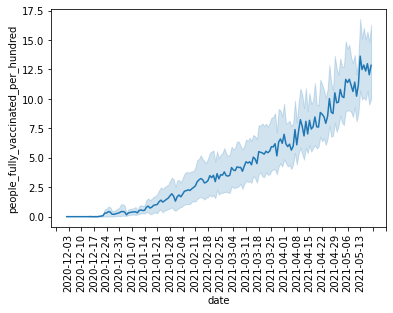

In [32]:
# total vaccined per hundred // not accumulated 
graph = sns.lineplot(data=df_sorted, x="date", y="people_fully_vaccinated_per_hundred")
graph.xaxis.set_major_locator(mdates.DayLocator(interval = 7))
# graph.xaxis.set_major_formatter(mdates.DateFormatter('%Y:%M:%D'))
plt.xticks(rotation = 90)

plt.show()


#### 2. Vaccinations by Manufacturer and Month

[Text(0.5, 0, 'Manufacturer'),
 Text(0.5, 1.0, 'Total Vaccination by Manufacturer'),
 Text(0, 0.5, 'Total Vaccinations')]

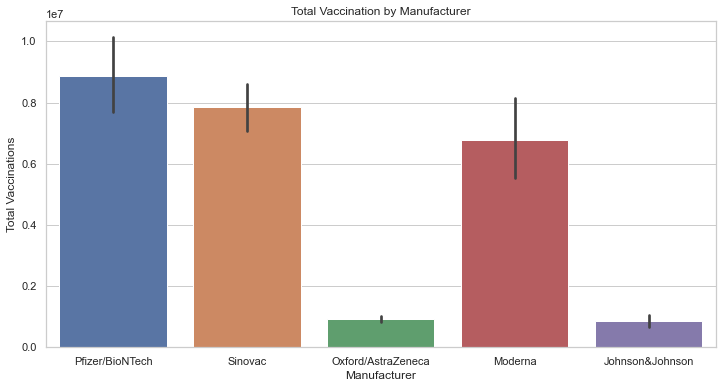

In [33]:
sns.set(style = 'whitegrid')
fig, ax = plt.subplots(figsize = (12, 6))
ax = sns.barplot(data = manu, x='vaccine', y='total_vaccinations')
ax.set(xlabel = 'Manufacturer', title = 'Total Vaccination by Manufacturer', ylabel = 'Total Vaccinations')

[Text(0.5, 1.0, 'Number of Vaccinations by Month'),
 Text(0, 0.5, 'Number of Vaccinations')]

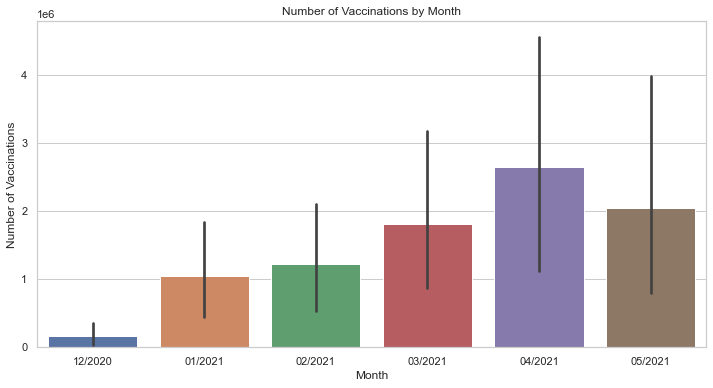

In [34]:
sns.set(style = 'whitegrid')
fig, ax = plt.subplots(figsize = (12, 6))
ax = sns.barplot(data = vacc_sum, x = 'Month', y = 'monthly_vacc', order = Month)
ax.set(title = 'Number of Vaccinations by Month', ylabel = 'Number of Vaccinations')

#### 3. The specific situations for ten countries

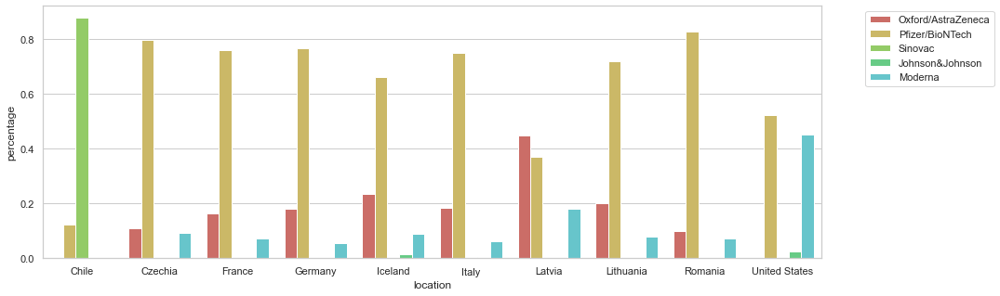

In [35]:
df_c1=manu.drop(['date'],axis=1)
df_c=df_c1.groupby(['location','vaccine']).agg('sum')
df_c=df_c.reset_index(level='vaccine')
df_c2=df_c1.groupby(['location']).agg('sum')
df_n=pd.merge(df_c,df_c2,on=['location'])
df_n['percentage'] = df_n['total_vaccinations_x']/df_n['total_vaccinations_y']
# this percentage shows the ratio of specific vaccine type usage in the corresponding countries. 
df_n=df_n.reset_index(level='location')
fig, ax = plt.subplots(figsize=(15, 5))
color_palette=sns.color_palette("hls", 8)
sns.barplot(data=df_n, x="location", y="percentage", hue='vaccine',palette=color_palette)
plt.legend(bbox_to_anchor=(1.05, 1),loc=2)

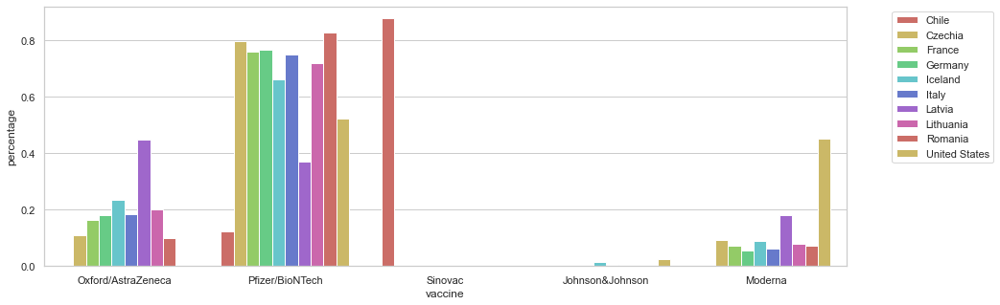

In [36]:
conn = sqlite3.connect("retail.db") 
df_n.to_sql('vaccine_percentage', conn, if_exists='replace', index=False)
#pd.read_sql('select * from vaccine_percentage', conn)
query=\
"""
SELECT vaccine,location,percentage
FROM vaccine_percentage
GROUP BY vaccine,location
"""
df_a = pd.read_sql_query(query, conn)
df_a
fig, ax = plt.subplots(figsize=(15, 5))
color_palette=sns.color_palette("hls", 8)
sns.barplot(data=df_n, x="vaccine", y="percentage", hue='location',palette=color_palette)
plt.legend(bbox_to_anchor=(1.05, 1),loc=2)
# We can see that Pfizer is the most popular vaccine. 

#### 4. Relationship between GDP per Capita and vaccination rate 

[702.44370782]
5430.740796685786


<AxesSubplot:xlabel='vaccination_rate', ylabel='gdpPerCapita'>

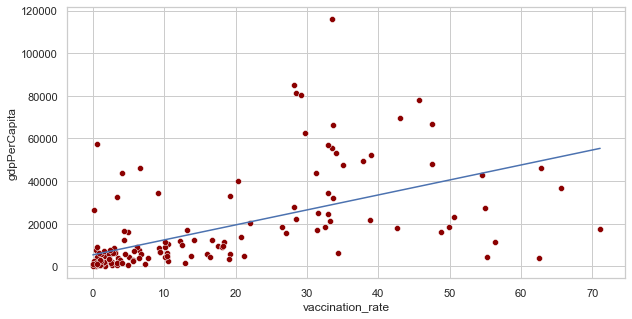

In [37]:
df_gm = df.merge(gm_max,how='left',left_on='country',right_on='Country')
conn = sqlite3.connect("retail.db") 
df_gm_1=df_gm.drop(['country'],axis=1)
df_gm_1.to_sql('country_vaccinations', conn, if_exists='replace', index=False)
query=\
"""
SELECT country,total_vaccinations,max(people_vaccinated_per_hundred) as vaccination_rate, gdp
FROM country_vaccinations
GROUP BY country
HAVING max(people_vaccinated_per_hundred) > 0 and max(people_vaccinated_per_hundred) <=100
"""
df_b = pd.read_sql_query(query, conn)
df_try=df_b.merge(l_df,how='left',left_on='Country',right_on='country')
df_try=df_try.dropna()
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(df_try[['vaccination_rate']], df_try[["gdpPerCapita"]]) 
print(LR.coef_[0]) #a in the model 
print(LR.intercept_[0]) # b in the model
plt.subplots(figsize=(10, 5))

ax=sns.scatterplot(data = df_try, 
                x=df_try['vaccination_rate'], 
                y=df_try["gdpPerCapita"],
                color='darkred'
                ) 
sns.lineplot(data = df_try, 
                x= df_try['vaccination_rate'], 
                y= LR.predict(df_try[['vaccination_rate']])[:,0])


## Interactive Bubble Plots

In [38]:
clean.loc[clean.country == "China", ("Year", "gdp")]

,Year,gdp
134,2013,11805.0
129,2013,11805.0
130,2013,11805.0
131,2013,11805.0
132,2013,11805.0
133,2013,11805.0


In [39]:
fig = px.scatter(clean, 
                  x = "gdp", y = "monthly_vacc",
                  color = "country",
                  hover_name="country",
                  size = "monthly_vacc",
                  animation_frame = 'Month',
                  animation_group = 'country',
                  height = 600, width = 800, size_max = 70, 
                  log_y = True, log_x = True)

fig.update_layout(title = 'GDP Per Capita vs. Monthly Vaccinations', 
                   xaxis_title = 'GDP Per Capita',
                   yaxis_title = 'Monthly Vaccinations',
                   margin={"r":0,"t":30,"l":0,"b":0})

fig.show()

In [40]:
fig2 = px.scatter(clean, 
                  x = "gdp", y = 'vacc_ratio',
                  color = "country",
                  hover_name="country",
                  size = "monthly_vacc",
                  animation_frame = 'Month',
                  animation_group = 'country',
                  height = 600, width = 800, size_max = 70, 
                  log_y = True, log_x = True)

fig2.update_layout(title = 'GDP Per Capita vs. Vaccination Ratio', 
                   xaxis_title = 'GDP Per Capita',
                   yaxis_title = 'Vaccination Ratio',
                   margin={"r":0,"t":30,"l":0,"b":0})

fig2.show()

In [41]:
#Save both figures by writing them to html
with open('GDP_Vaccination.html', 'w') as f:
    f.write(fig.to_html(full_html = True, include_plotlyjs = True))
    f.write(fig2.to_html(full_html = True, include_plotlyjs = True))

### Vizualizing Vaccination Across the World

In [42]:
def world(feature):
    to_be_mapped = feature
    vmin, vmax = 0,100
    fig, ax = plt.subplots(1, figsize=(25,25))

    mapped.plot(column=to_be_mapped, cmap='Blues', linewidth=0.8, ax=ax, edgecolors='0.8')
    ax.set_title('x', fontdict={'fontsize':30})
    ax.set_axis_off()
    #plotly Mappable scatter maxplot
    sm = plt.cm.ScalarMappable(cmap='Blues', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []

    cbar = fig.colorbar(sm, orientation='horizontal')



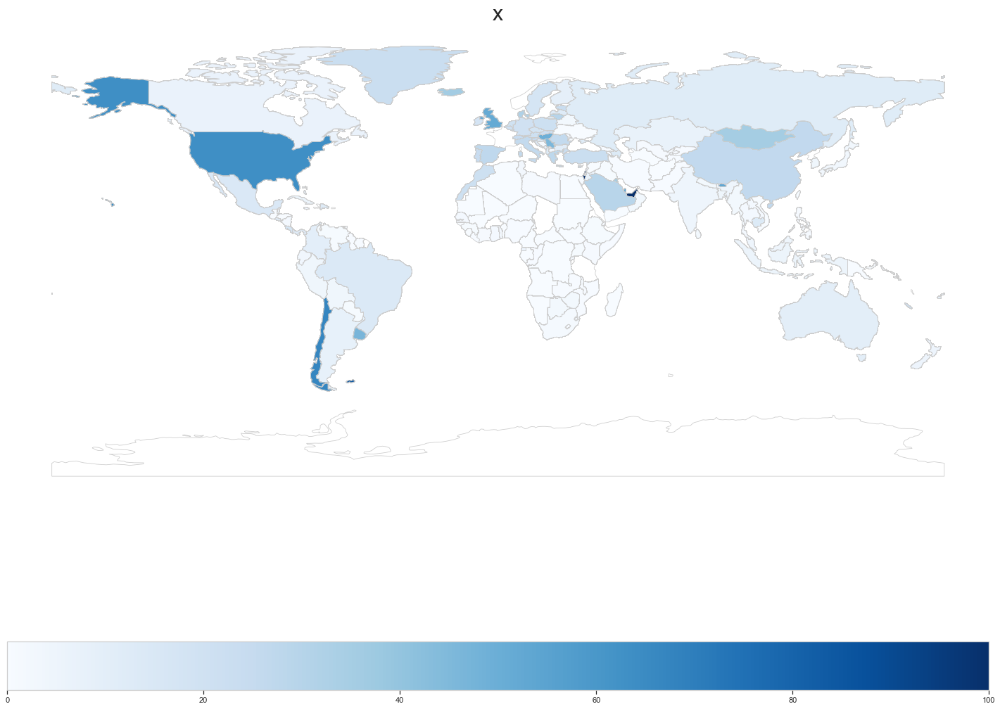

In [43]:
# binary varibable 
world('people_fully_vaccinated_per_hundred')

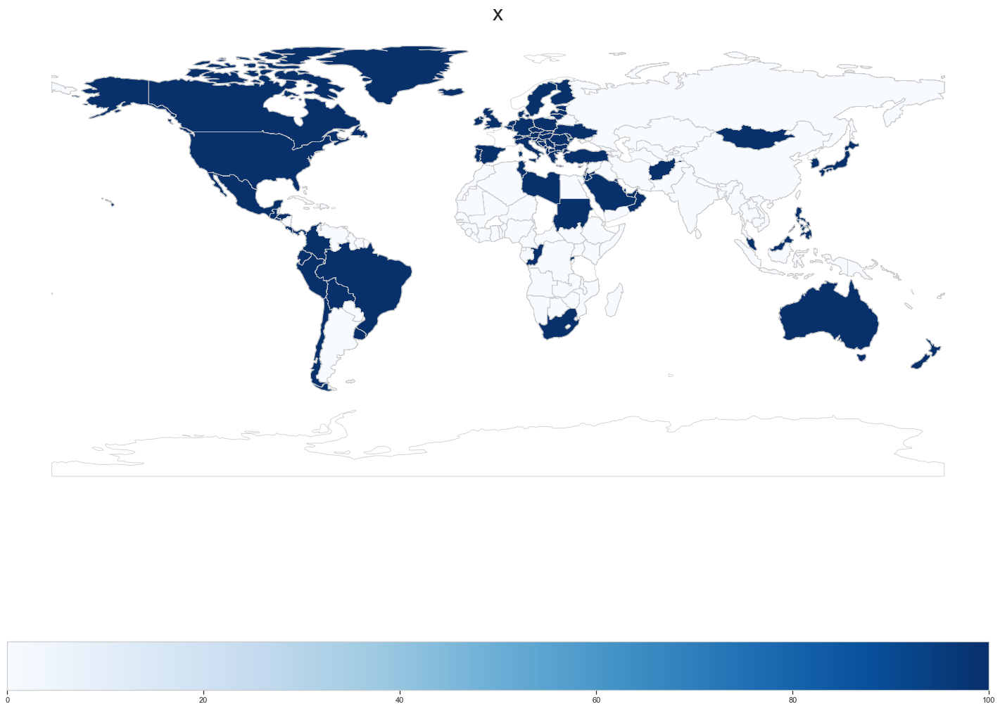

In [44]:
#American Made
world('American')



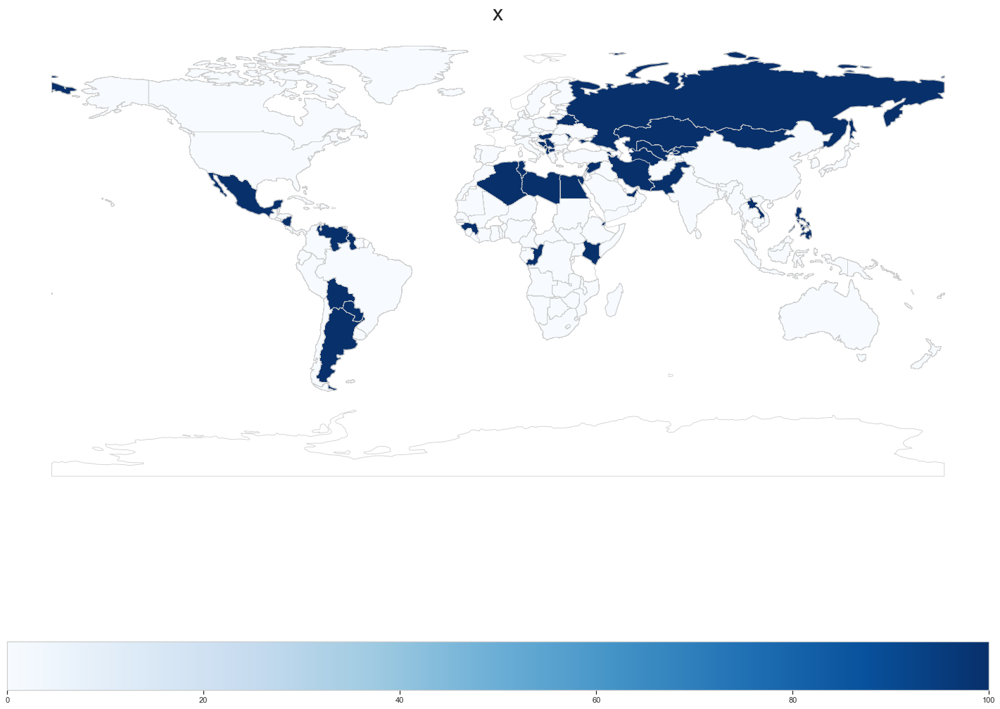

In [45]:
#Russian Made
world('Russian')


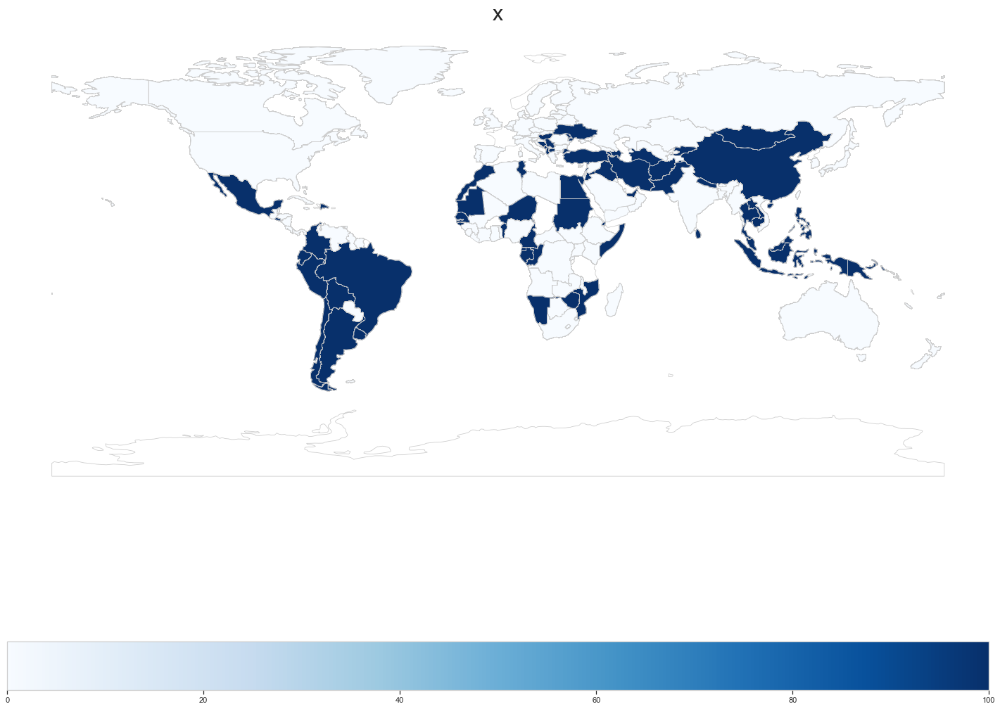

In [46]:
#China made
world('Chinese')



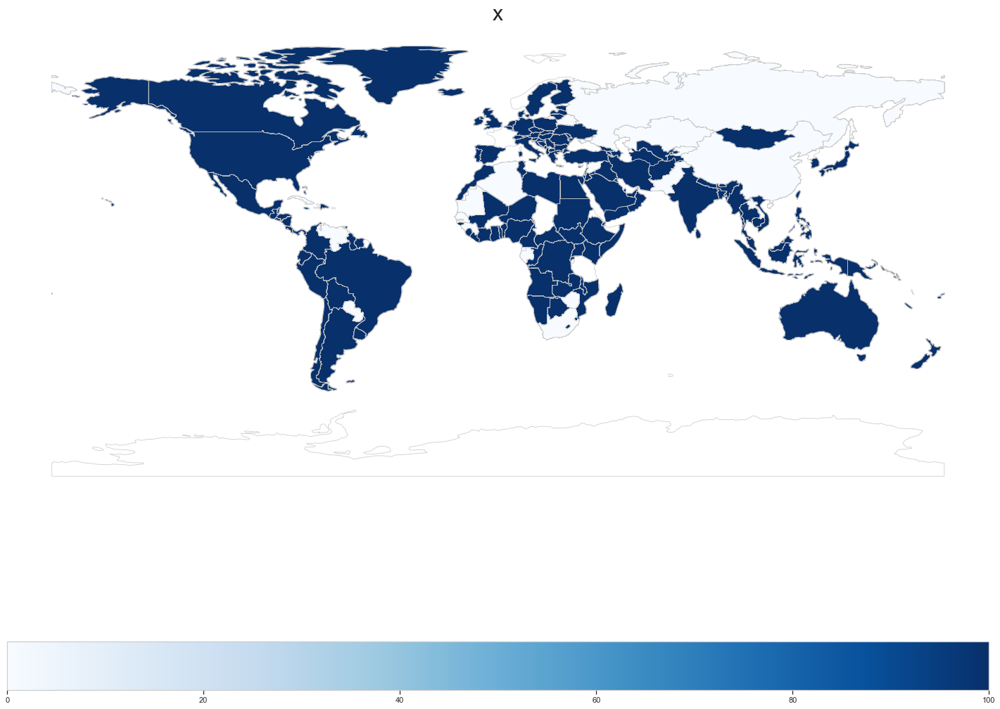

In [47]:
#European made
world('European')



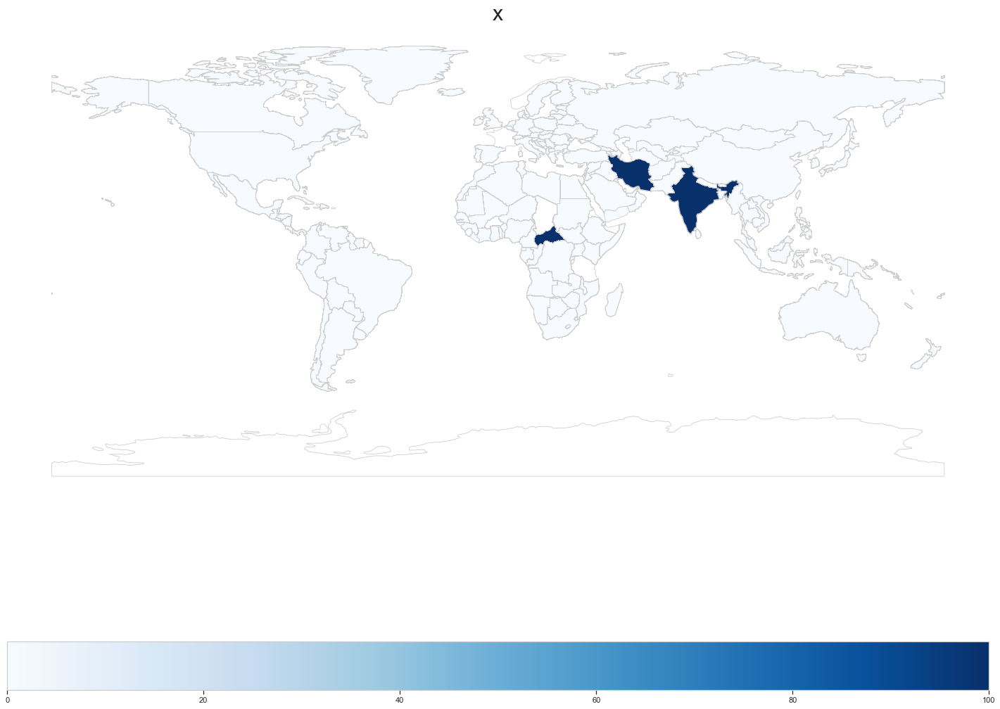

In [48]:
#Indian Made
world('Indian')



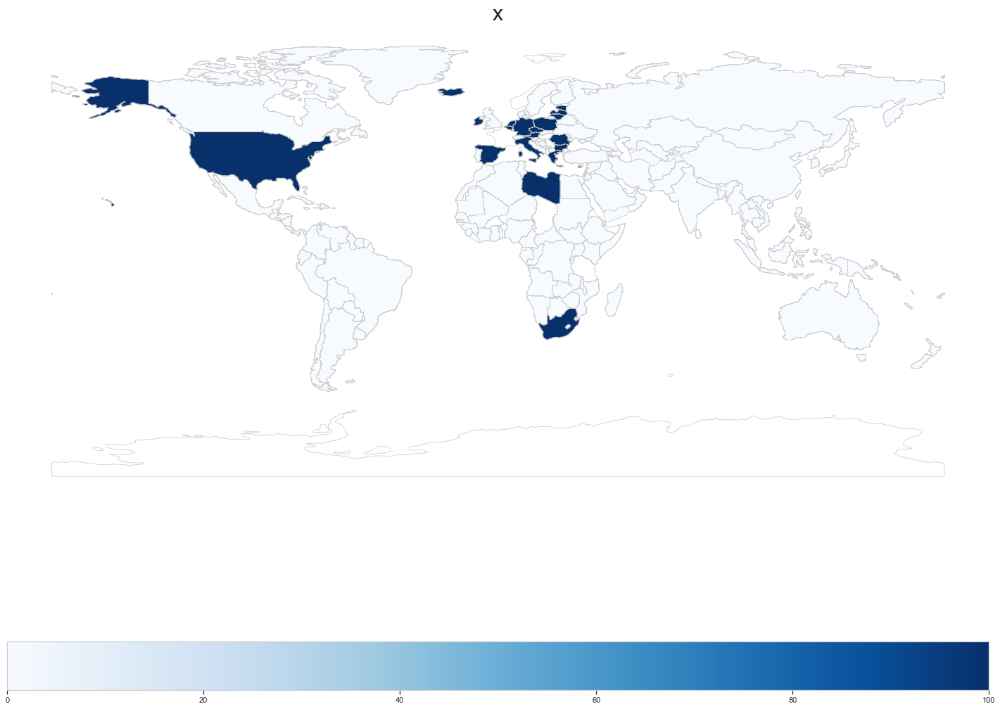

In [49]:
#Johnson&johnson
world('JJ')


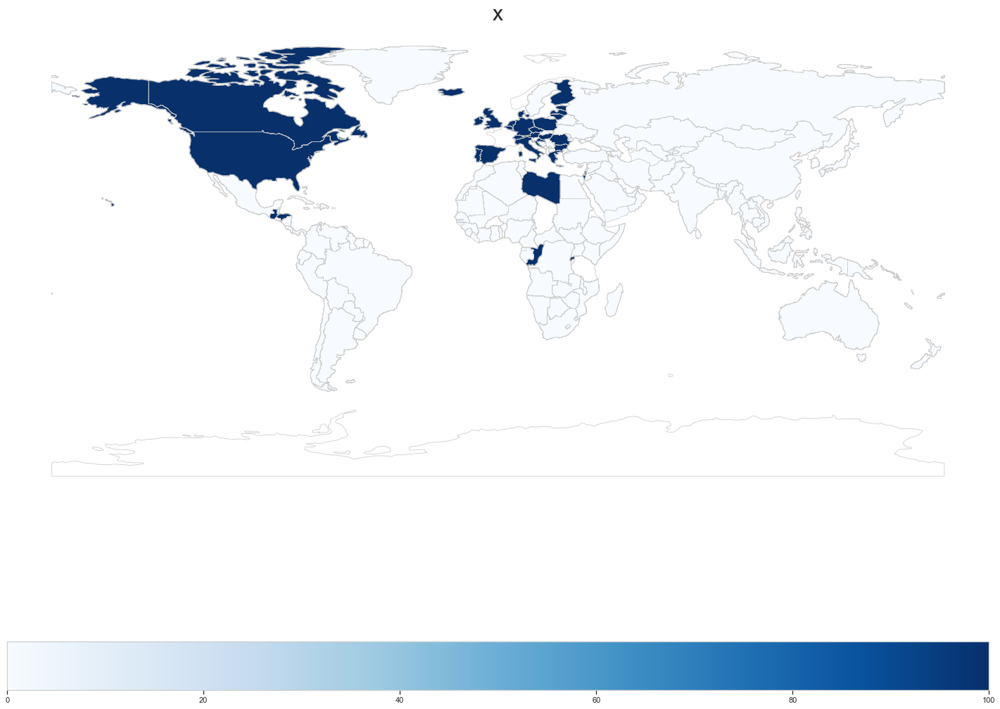

In [50]:
#Moderna
world('Moderna')


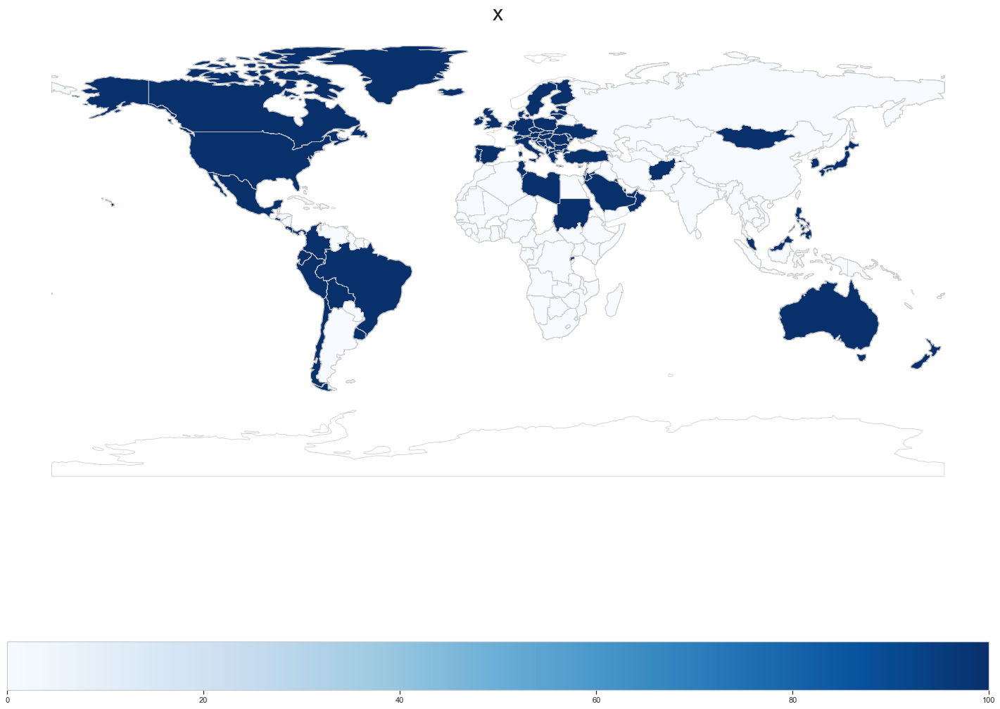

In [51]:
#Pfizer
world('Pfizer')

In [54]:
fig3 = px.choropleth(df_sorted_res,                            # Input Dataframe
                     locations="iso_code",           # identify country code column
                     color="Total_vaccination",                     # identify representing column
                     hover_name="country",              # identify hover name
                     animation_frame="date",        # identify date column
                     projection="natural earth",        # select projection
                     color_continuous_scale = 'Peach',  # select prefer color scale
                     range_color=[0,50000]              # select range of dataset
                     )        
fig3.show()          

In [55]:
with open('Vaccination Rate Change.html', 'w') as f:
    f.write(fig3.to_html(full_html = True, include_plotlyjs = True))
   